<a href="https://colab.research.google.com/github/DimitriLeandro/DA2Group10/blob/main/predicting_validation_data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install satellighte

In [2]:
import satellighte as sat
import torch
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from time import time
from matplotlib.image import imsave
from PIL import Image
from pathlib import Path
from torchvision import transforms as tt
from torchvision.transforms.transforms import Resize
from torch.utils.data import DataLoader
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import balanced_accuracy_score, accuracy_score, classification_report, confusion_matrix

plt.rcParams["figure.figsize"] = (15, 15)

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
def sliding_window(img, size=256, step=0.5):
    step = int(step*size)
    for i in np.arange(0, img.shape[0], step):
        for j in np.arange(0, img.shape[1], step):
            x_min = i 
            x_max = i + size
            y_min = j
            y_max = j + size
            if x_max > img.shape[0]:
                x_max = img.shape[0] - 1
                x_min = x_max - size 
            if y_max > img.shape[1]:
                y_max = img.shape[1] - 1
                y_min = y_max - size 
            yield (
                img[y_min:y_max, x_min:x_max, :], 
                int((y_max+y_min)/2),
                int((x_max+x_min)/2),
                y_min,
                x_min,
                y_max,
                x_max,
            )

In [44]:
def draw_coordinates(img, df_original_coordinates, results_dir, img_name, suffix, channel, border=15):
    img_coordinates = img.copy()
    for i, row in df_original_coordinates.iterrows():
        x_min = row['x_upper_left']
        x_max = row['x_lower_right']
        y_min = row['y_upper_left']
        y_max = row['y_lower_right']
        img_coordinates[y_min:y_min+border, x_min:x_max,        channel] = 255
        img_coordinates[y_max:y_max+border, x_min:x_max,        channel] = 255
        img_coordinates[y_min:y_max,        x_min:x_min+border, channel] = 255
        img_coordinates[y_min:y_max,        x_max:x_max+border, channel] = 255
    plt.imshow(img_coordinates)
    plt.show()
    imsave(results_dir.joinpath('{}_{}.png'.format(str(img_name)[:-4], suffix)), img_coordinates)
    return img_coordinates

In [6]:
def slide_and_predict(img, model, val_tt, labels_map, size, step, columns):
    windows = sliding_window(img, size, step)
    preds   = []

    for window, y_target, x_target, y_upper_left, x_upper_left, y_lower_right, x_lower_right in windows:
        img_tt    = np.array(val_tt(window))[:, :, :3]
        dict_pred = model.predict(img_tt)[0]
        pred      = max(dict_pred, key=dict_pred.get)
        pred_map  = labels_map.get(pred, 'background')
        if pred_map != 'background':
            preds.append([
                pred,
                y_target,
                x_target,
                y_upper_left,
                x_upper_left,
                y_lower_right,
                x_lower_right
            ])
        # print('({}, {}) -> {}'.format(y_target, x_target, pred))

    df_pred_coordinates = pd.DataFrame(
        data    = preds,
        columns = columns
    )

    return df_pred_coordinates

In [31]:
def check_intersection(row_a, row_b, increase=0):
    def increase_size(row, increase):
        row['y_upper_left']  -= increase
        row['x_upper_left']  -= increase
        row['y_lower_right'] += increase
        row['x_lower_right'] += increase
        return row
    
    row_a = increase_size(row_a, increase)
    row_b = increase_size(row_b, increase)
    
    if row_b['y_upper_left'] > row_a['y_lower_right']:
        return None
    if row_b['x_upper_left'] > row_a['x_lower_right']:
        return None
    if row_b['y_lower_right'] < row_a['y_upper_left']:
        return None
    if row_b['x_lower_right'] < row_a['x_upper_left']:
        return None
    
    row_a['y_upper_left']  = max(row_a['y_upper_left'], row_b['y_upper_left'])
    row_a['y_lower_right'] = min(row_a['y_lower_right'], row_b['y_lower_right'])
    row_a['x_upper_left']  = max(row_a['x_upper_left'], row_b['x_upper_left'])
    row_a['x_lower_right'] = min(row_a['x_lower_right'], row_b['x_lower_right'])
    
    return row_a

In [42]:
def get_final_coordinates(df_pred_coordinates, increase_final=100, max_size=8000):
    ignore_idxs        = []
    df_new_coordinates = pd.DataFrame(columns=df_pred_coordinates.columns)

    for i, row_a in df_pred_coordinates.iterrows():
        
        if i in ignore_idxs:
            continue
            
        final_row = row_a
        
        for j, row_b in df_pred_coordinates.iterrows():
            
            if j <= i:
              continue

            if j in ignore_idxs:
                continue
                
            if row_a['label'] != row_b['label']:
                continue
                
            inter_row = check_intersection(final_row, row_b, increase=0)
            if inter_row is not None:
                final_row = inter_row
                ignore_idxs.append(j)
                
        df_new_coordinates.loc[i] = final_row

    df_new_coordinates.reset_index(inplace=True, drop=True)
    df_new_coordinates['y_target']      = ((df_new_coordinates['y_upper_left']+df_new_coordinates['y_lower_right'])/2).astype(int)
    df_new_coordinates['x_target']      = ((df_new_coordinates['x_upper_left']+df_new_coordinates['x_lower_right'])/2).astype(int)
    df_new_coordinates['y_upper_left']  = df_new_coordinates['y_target'].apply(lambda c: max(0,        c-increase_final))
    df_new_coordinates['y_lower_right'] = df_new_coordinates['y_target'].apply(lambda c: min(max_size, c+increase_final))
    df_new_coordinates['x_upper_left']  = df_new_coordinates['x_target'].apply(lambda c: max(0,        c-increase_final))
    df_new_coordinates['x_lower_right'] = df_new_coordinates['x_target'].apply(lambda c: min(max_size, c+increase_final))
    
    return df_new_coordinates

In [7]:
if torch.cuda.is_available():
  model = torch.load('/content/drive/MyDrive/task_2_models_checkpoint/task_2_model_checkpoint_all_layers_round_5-v1.pt')
else:
  model = torch.load(
    '/content/drive/MyDrive/task_2_models_checkpoint/task_2_model_checkpoint_all_layers_round_5-v1.pt', 
    map_location=torch.device('cpu')
  )

model.eval()

val_tt = tt.Compose([tt.ToPILImage(), tt.Resize((240, 240))])

labels_map = {
    'Industrial':           'trampoline',
    'Highway':              'solar',
    'HerbaceousVegetation': 'pools',
    'AnnualCrop':           'background',
    'Forest':               'ponds'
}

In [9]:
imgs_dir    = Path('/content/drive/MyDrive/validation_data/02_validation_data_images/')
results_dir = imgs_dir.joinpath('results')

for img_path in imgs_dir.iterdir():
  if img_path.suffix != '.png':
    continue
  
  img = np.array(Image.open(img_path))
  df_original_coordinates = pd.read_csv(str(img_path)[:-3]+'csv')
  img_original_coordinates = draw_coordinates(
      img, 
      df_original_coordinates, 
      results_dir, 
      img_name = img_path.name, 
      suffix   = 'original_coordinates', 
      channel  = 2, 
      border   = 15
  )
  df_pred_coordinates = slide_and_predict(img, model, val_tt, labels_map, 256, 0.5, df_original_coordinates.columns)
  df_pred_coordinates.to_csv(results_dir.joinpath(img_path.name[:-4] + '_first_preds.csv'))
  _ = draw_coordinates(
      img_original_coordinates, 
      df_pred_coordinates, 
      results_dir, 
      img_name = img_path.name, 
      suffix   = 'first_preds', 
      channel  = 0, 
      border   = 15
  )

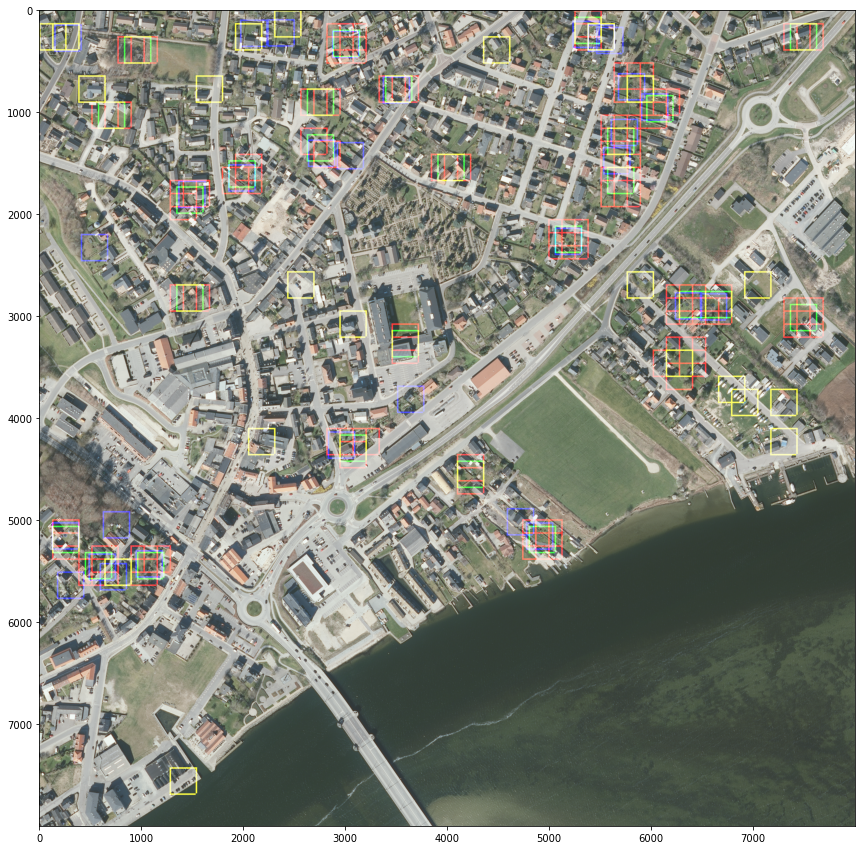

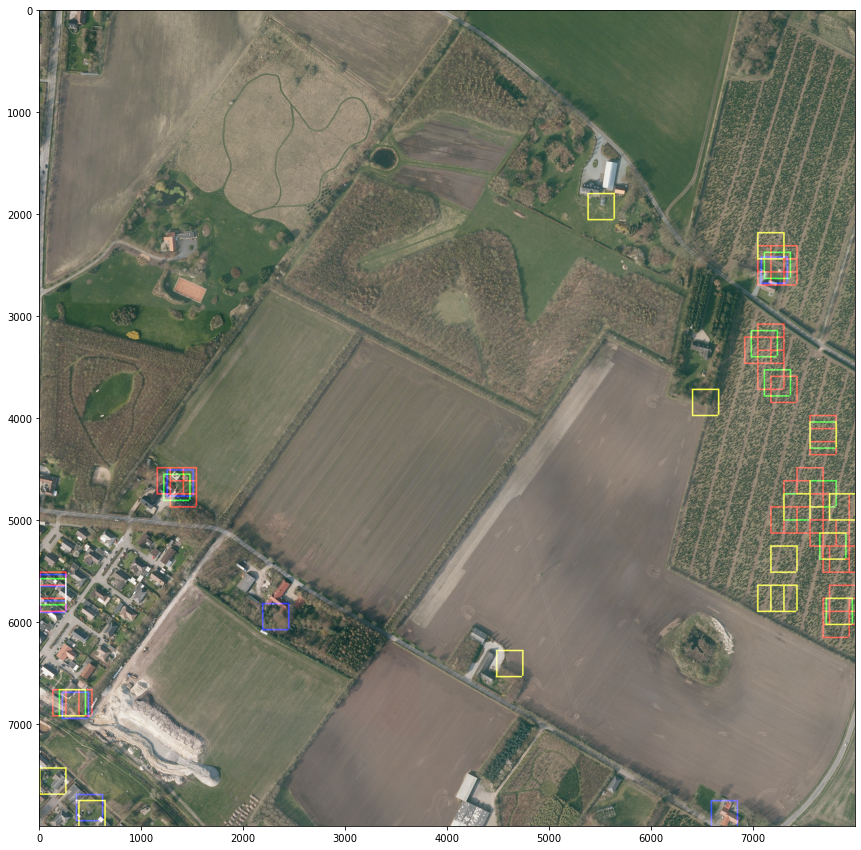

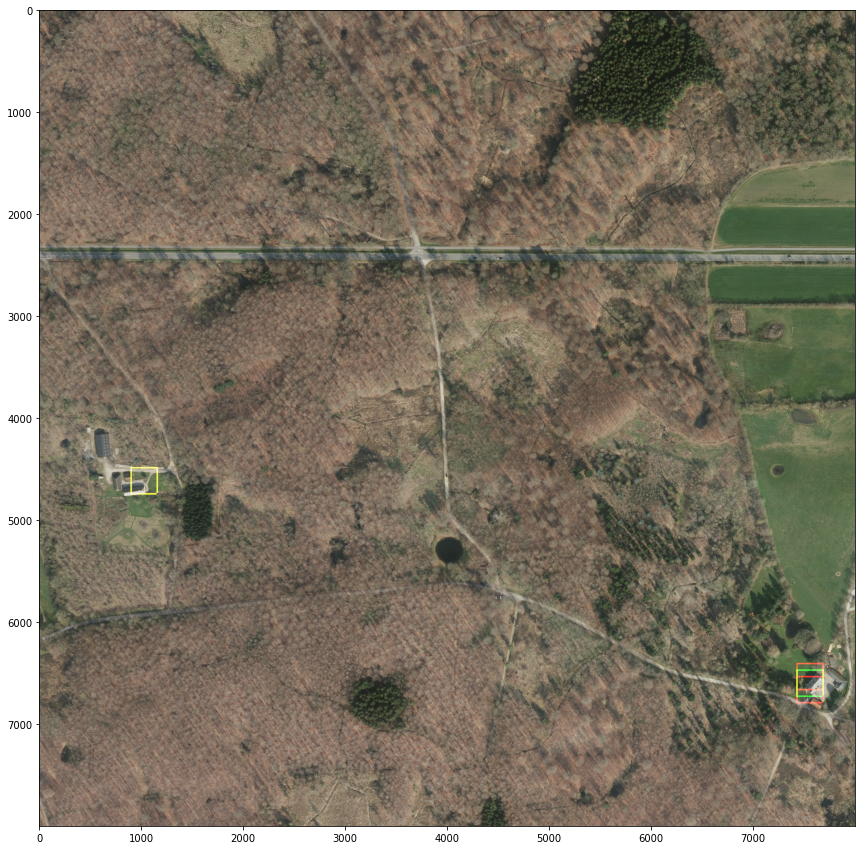

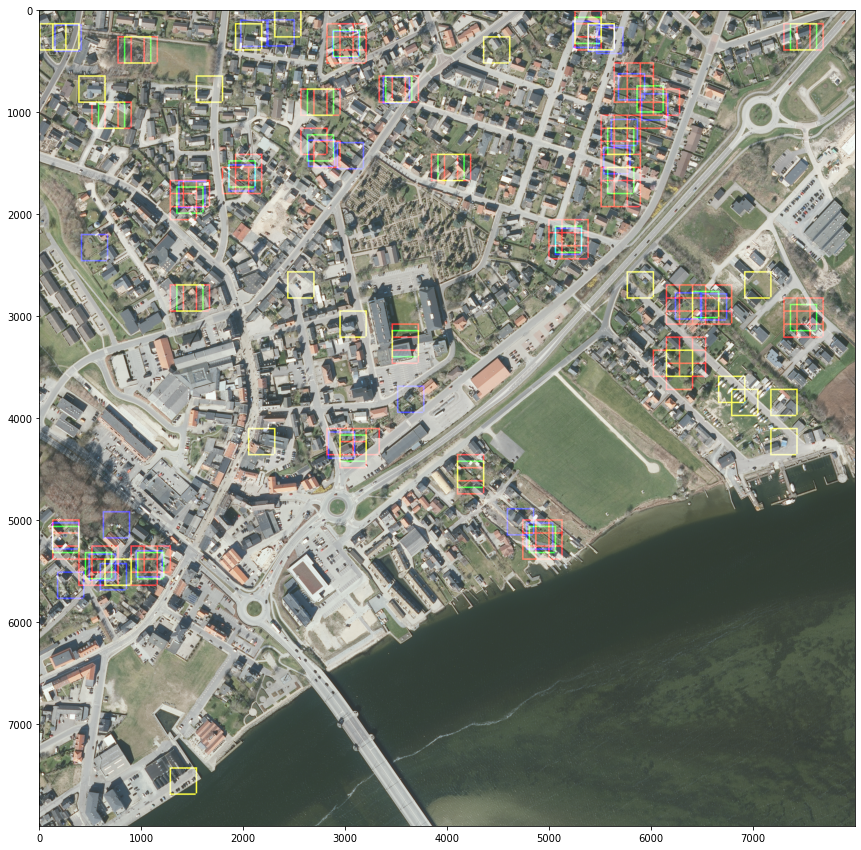

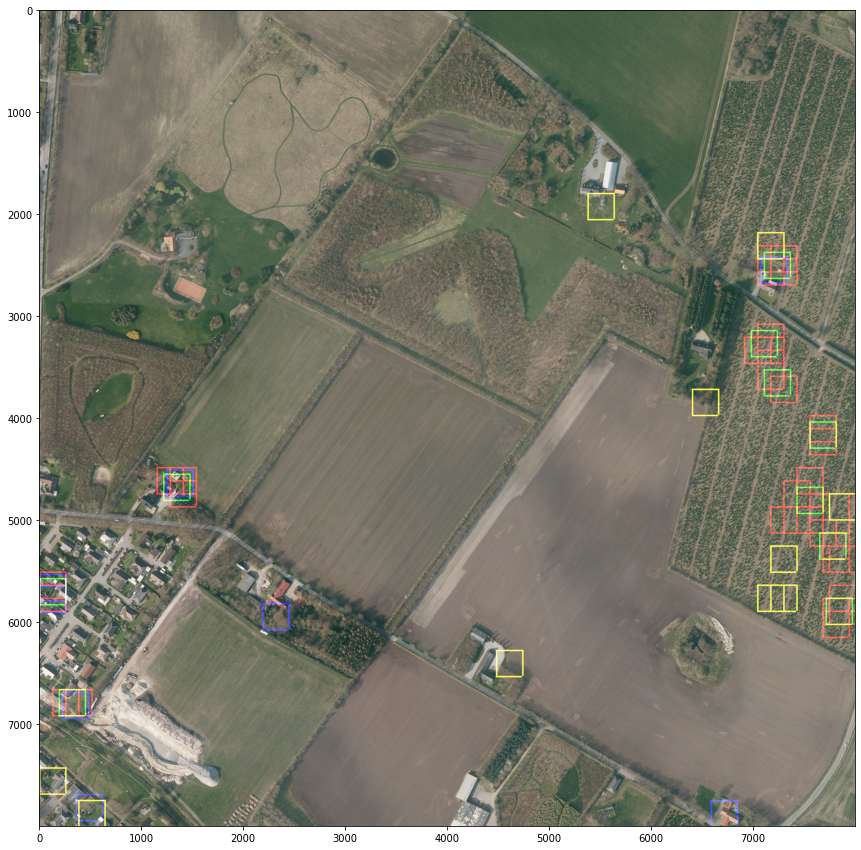

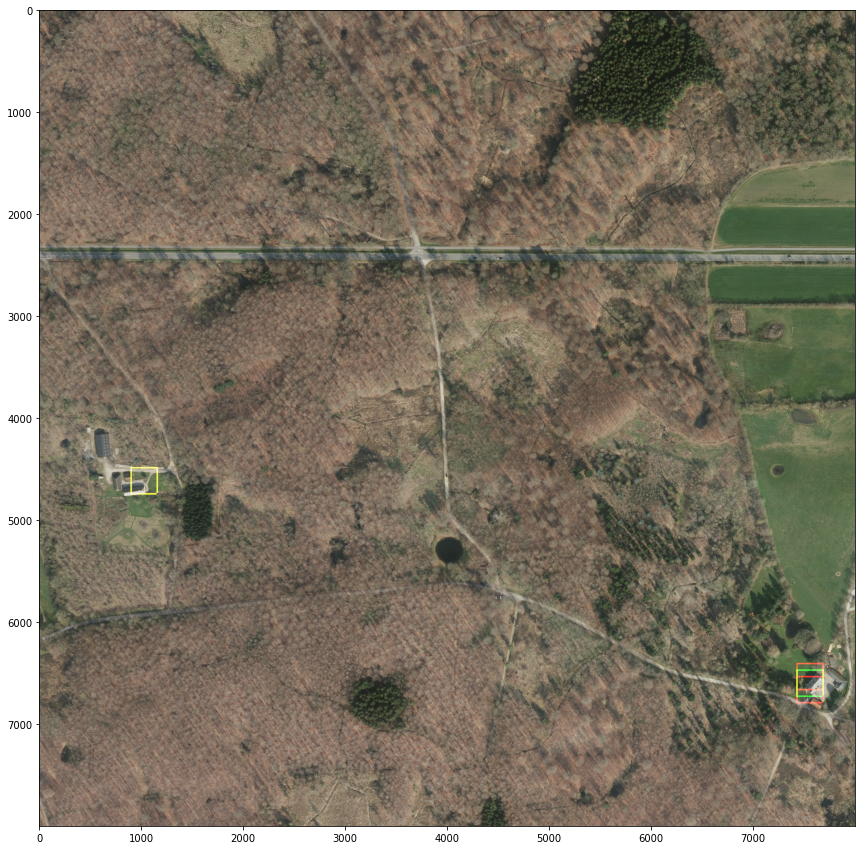

In [49]:
for csv_path in results_dir.iterdir():
    if csv_path.suffix != '.csv':
        continue
  
    df_pred_coordinates = pd.read_csv(csv_path)
    df_final_coordinates = get_final_coordinates(df_pred_coordinates, increase_final=128, max_size=8000)
    df_final_coordinates.to_csv(results_dir.joinpath(csv_path.name.split('_')[0] + '_final_preds.csv'))
    img_path = csv_path.parent.joinpath(csv_path.name.split('_')[0] + '_first_preds.png')
    img = np.array(Image.open(img_path))
    draw_coordinates(img, df_final_coordinates, results_dir, img_path.name, 'final_predictions_increse_128', 1, border=15)